/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


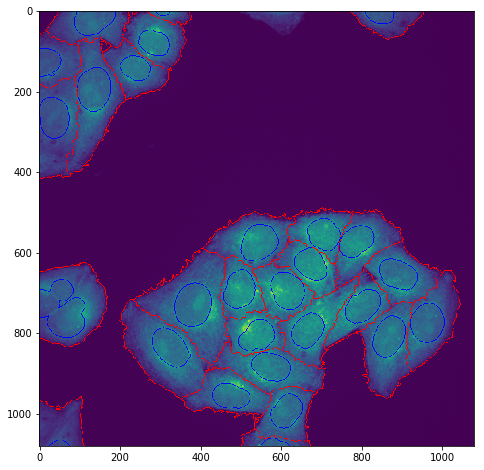

In [2]:
%matplotlib inline
from FishAnalyser import *

def show_cells(self, show=True):
    if self.cells.ndim == 2:
        f, (ax0, ax1) = plt.subplots(ncols=2, figsize=(16, 8))

        im = numpy.amax(self.image_raw, 2)

        ax0.imshow(im)
        ax1.imshow(im)
        boundaries_nuc = find_boundaries(self.nuclei_image)
        boundaries_cyt = find_boundaries(self.cells)
        ax1.imshow(numpy.ma.masked_where(boundaries_nuc == 0, boundaries_nuc), cmap=colors.ListedColormap(['blue']))
        ax1.imshow(numpy.ma.masked_where(boundaries_cyt == 0, boundaries_cyt), cmap=colors.ListedColormap(['red']))

        f.show()

    if self.cells.ndim == 3:
        f = plt.figure(figsize=(10, 10))
        ax = f.gca(projection='3d')

        X, Y = numpy.meshgrid(numpy.arange(self.cells.shape[0]), numpy.arange(self.cells.shape[0]))
        Z = self.cells
        surf = ax.plot_surface(X, Y, numpy.sum(Z > 0, axis=-1), cmap='viridis',
                               linewidth=0, antialiased=False)
        ax.set_zlim(0, 60)

        f.show()

    return f

im_path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/r02c09f05-ch2sk1fk1fl1.tif'
nuc = DAPIimage()
nuc.load(im_path.replace('ch2', 'ch3'), shape=(1024, 1024, 35), dtype='uint16')
nuc.segment(FastNuclei())
im = CYTimage(nuc.nucleis)

im.load(im_path, shape=(1024, 1024, 35))
im.show_image()
im.segment(CytoSegmenter2())
f = show_cells(im, show=False)


/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


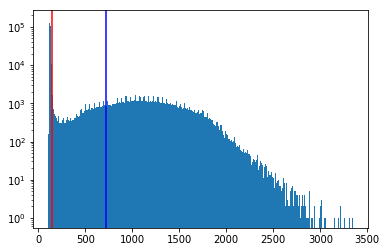

In [4]:
raw = im.image_raw.copy()
base = numpy.amax(raw, 2)

GMM = GaussianMixture(n_components=2, n_init=5, max_iter=150)
GMM.fit(base.reshape(-1, 1))
values = numpy.unique(base)
ys = GMM.predict(values.reshape(-1, 1))
cyto_lab = numpy.argmax(GMM.means_.ravel())
gmm_thresh = values[numpy.argmax(ys==cyto_lab)]
otsu_thresh = threshold_otsu(base)

f, ax = plt.subplots()
ax.hist(base.ravel(), bins=1000)
ax.axvline(x=gmm_thresh, c='r')
ax.axvline(x=otsu_thresh, c='b')
ax.set_yscale('log')
f.show()

/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


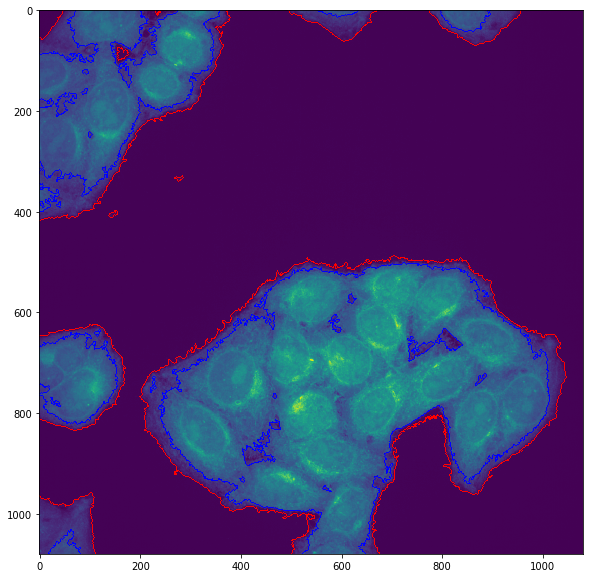

In [5]:
def gmm_threshold2(img, n_components=3, plot=False, border=-1, return_aic=False):
    if img.ndim > 2:
        warnings.warn('Working on a 3d image, expect high computational time.')
    flag = False
    GMM = GaussianMixture(n_components=n_components)
    GMM.fit(img.reshape(-1, 1))
    # Find threshold
    xs = numpy.linspace(img.min(), img.max(), 1000)
    ys = GMM.predict(xs.reshape(-1, 1))
    inds = numpy.nonzero(ys[1:] - ys[:-1])[0]
    # print(ys)
    thresh = xs[inds[border]]
    # otsu = threshold_otsu(img)
    # means = numpy.sort(GMM.means_.ravel())
    # thresh = numpy.mean([means[1:], means[:-1]], axis=0)[border]
    # print(numpy.mean([means[1:], means[:-1]], axis=0))
    if plot:
        f, ax = plt.subplots(figsize=(8, 8))
        ax.hist(img.ravel(), bins=255, label='Observed data')
        sample, _ = GMM.sample(numpy.prod(img.shape))
        ax.hist(sample[sample > img.min()], bins=255, alpha=0.5, label='Model')
        ax.axvline(thresh, c='r')
        ax.axvline(275, c='g', linestyle='dashed')
        # ax.axvline(otsu, c='b')
        ax.text(thresh-75, 10,  'GMM Threshold', rotation=90, color='r')
        ax.text(275 + 25, 1.e5, '"optimal" Threshold', rotation=90, color='g')
        # ax.text(otsu + 25, 10, 'Otsu Threshold', rotation=90, color='b')
        ax.set_xticks(list(range(0, 3000, 500)) + [thresh])
        ax.set_yscale('log')
        ax.set_title('Cell mask pixel intensity histogram (blue) and fitted GMM (light orange)')
        ax.set_xlabel('Pixel intensity values')
        ax.set_ylabel('Pixels count (log)')
        ax.legend()
        ax.set_xlim([0, 3000])
        f.show()
    if return_aic:
        return thresh, GMM.aic(img.reshape(-1, 1))
    return thresh


gmm_thresh = gmm_threshold2(base, n_components=2)
otsu_thresh = threshold_otsu(base)
mask_gmm = base > gmm_thresh
mask_gmm = remove_small_holes(mask_gmm, 50)
mask_gmm = remove_small_objects(mask_gmm, 50)
mask_otsu = base > otsu_thresh
mask_otsu = remove_small_holes(mask_otsu, 50)
mask_otsu = remove_small_objects(mask_otsu, 50)

f, ax0 = plt.subplots(figsize=(10, 10))
bound_gmm = find_boundaries(mask_gmm)
bound_otsu = find_boundaries(mask_otsu)
ax0.imshow(base)
ax0.imshow(numpy.ma.masked_where(bound_gmm == 0, bound_gmm), cmap=colors.ListedColormap(['red']))
ax0.imshow(numpy.ma.masked_where(bound_otsu == 0, bound_otsu), cmap=colors.ListedColormap(['blue']))
ax0.plot([0], c='r', label='GMM detection')
ax0.plot([0], c='b', label='Otsu detection')
f.suptitle('Comparison in situ of GMM threshold and Otsu threshold')
ax0.legend()
# ax0.imshow(mask_gmm)
f.show()

5.081404


/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


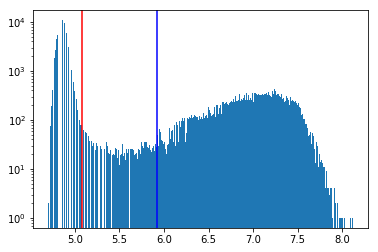

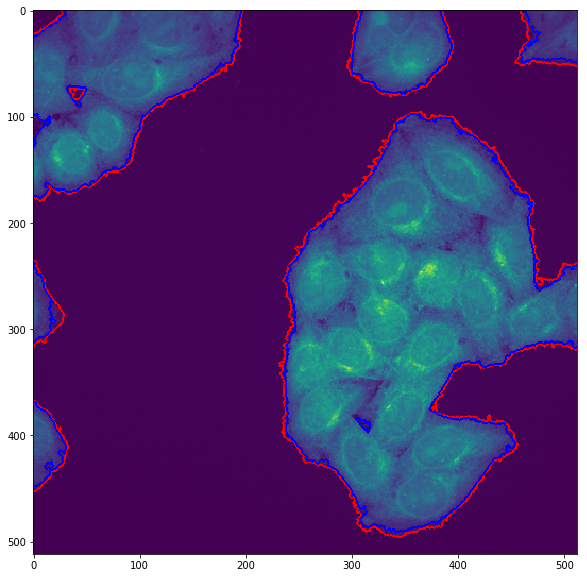

In [4]:
raw = im.image_raw.copy()
base = numpy.log1p(numpy.amax(raw, 2))

GMM = GaussianMixture(n_components=2)
GMM.fit(base.reshape(-1, 1))
values = numpy.unique(base)
ys = GMM.predict(values.reshape(-1, 1))

gmm_thresh = values[numpy.argmax(ys)]
print(gmm_thresh)
otsu_thresh = threshold_otsu(base)

f, ax = plt.subplots()
ax.hist(base.ravel(), bins=1000)
ax.axvline(x=gmm_thresh, c='r')
ax.axvline(x=otsu_thresh, c='b')
ax.set_yscale('log')
f.show()

mask_gmm = base > gmm_thresh
mask_gmm = remove_small_holes(mask_gmm, 50)
mask_gmm = remove_small_objects(mask_gmm, 50)
mask_otsu = base > otsu_thresh
mask_otsu = remove_small_holes(mask_otsu, 50)
mask_otsu = remove_small_objects(mask_otsu, 50)

f, ax0 = plt.subplots(figsize=(10, 10))
bound_gmm = find_boundaries(mask_gmm)
bound_otsu = find_boundaries(mask_otsu)
ax0.imshow(numpy.amax(raw, 2))
ax0.imshow(numpy.ma.masked_where(bound_gmm == 0, bound_gmm), cmap=colors.ListedColormap(['red']))
ax0.imshow(numpy.ma.masked_where(bound_otsu == 0, bound_otsu), cmap=colors.ListedColormap(['blue']))
# ax0.imshow(mask_gmm)
f.show()

/Users/remydubois/anaconda3/lib/python3.6/site-packages/skimage/filters/rank/generic.py:102: UserWarning: Bitdepth of 11 may result in bad rank filter performance due to large number of bins.
  "performance due to large number of bins." % bitdepth)
/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


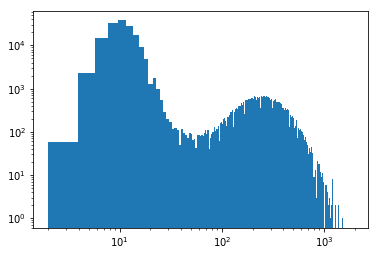

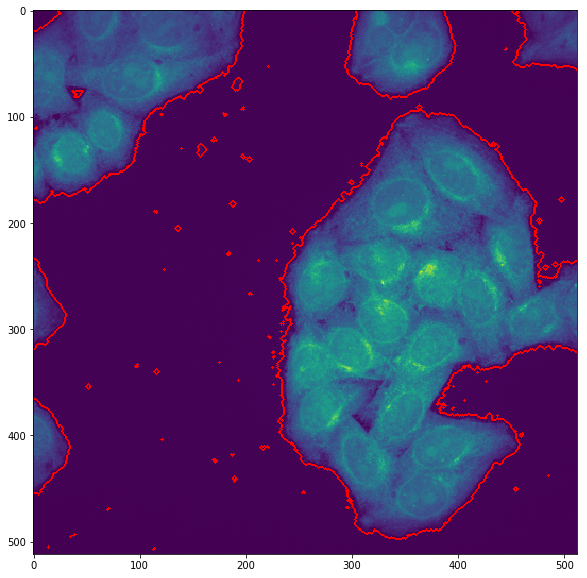

In [86]:
raw = im.image_raw.copy()
base = numpy.amax(raw, 2)
grads = rank.gradient(base, disk(2))

X = numpy.hstack((base.reshape(-1, 1), grads.reshape(-1, 1)))
# X = grads.reshape(-1, 1)
GMM = GaussianMixture(n_components=2, n_init=5)
GMM.fit(X)
mask_gmm = GMM.predict(X).reshape(512, 512)

f, ax = plt.subplots()
ax.hist(grads.ravel(), bins=1000)
# ax.axvline(x=gmm_thresh, c='r')
# ax.axvline(x=otsu_thresh, c='b')
ax.set_yscale('log')
ax.set_xscale('log')
f.show()

f, ax0 = plt.subplots(figsize=(10, 10))
bound_gmm = find_boundaries(mask_gmm)
ax0.imshow(base)
ax0.imshow(numpy.ma.masked_where(bound_gmm == 0, bound_gmm), cmap=colors.ListedColormap(['red']))
# ax0.imshow(numpy.ma.masked_where(bound_otsu == 0, bound_otsu), cmap=colors.ListedColormap(['blue']))
# ax0.imshow(mask_gmm)
f.show()

Segmenting...17 nucleis found.


/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


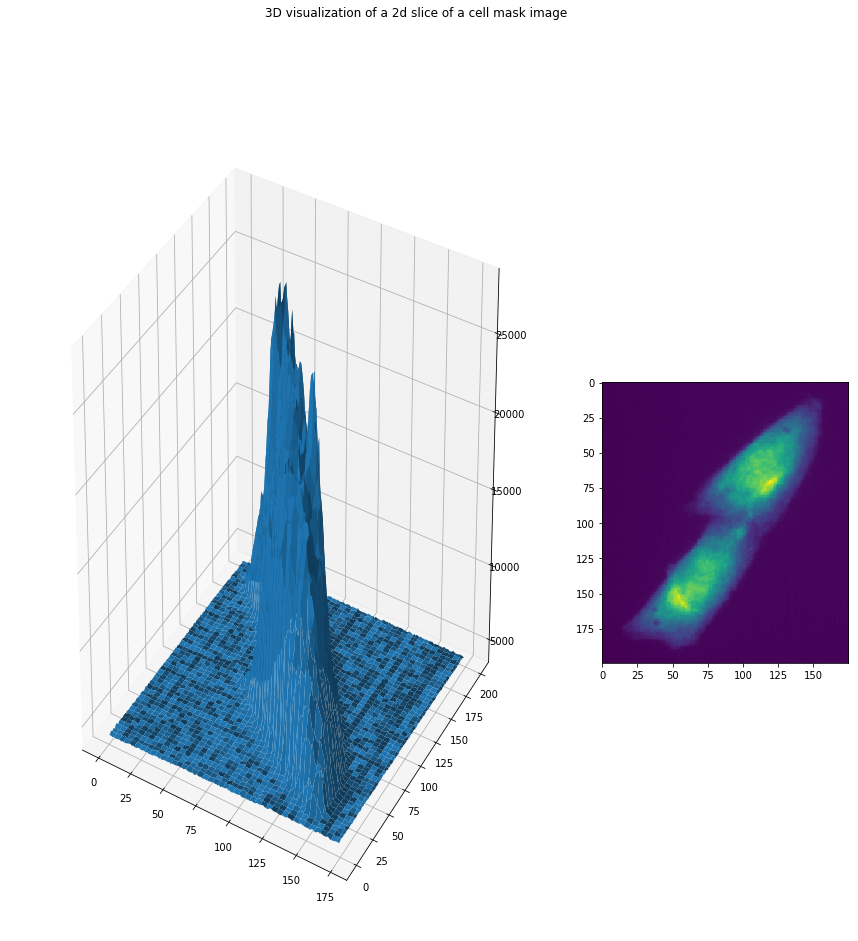

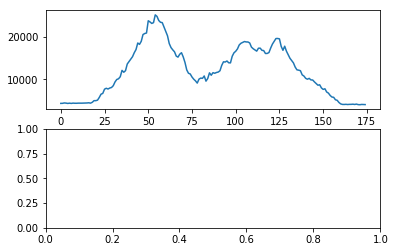

In [15]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import gridspec
im_path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/r02c09f06-ch2sk1fk1fl1.tif'
nuc = DAPIimage()
nuc.load(im_path.replace('ch2', 'ch3'), shape=(512, 512, 35), dtype='uint8')
nuc.segment()
im = CYTimage(nuc.nucleis)

im.load(im_path, shape=(512, 512, 35))
raw = im.image_raw.copy()

gridspec.GridSpec(3,3)
seed = numpy.sum(raw, axis=2)[275:475, 125:300]
fig = plt.figure(figsize=(15, 15))
ax = plt.subplot2grid((1, 3), (0, 0), colspan=2, projection='3d')
X = numpy.arange(0, 175)
Y = numpy.arange(0, 200)
X, Y = numpy.meshgrid(X, Y)
ax.plot_surface(X, Y, seed)
# ax[1].imshow(seed)
ax2 = plt.subplot2grid((1, 3), (0, 2))
ax2.imshow(seed)
fig.suptitle('3D visualization of a 2d slice of a cell mask image')
fig.show()

f, (ax0, ax1) = plt.subplots(nrows=2)
crest = numpy.diagonal(seed[:, ::-1], offset=-20)
ax0.plot(crest)
# seed[nuc.nucleis > 0] = seed.min()
# ax1.plot(list(range(seed.shape[0])), seed[:, 380])
# f.show()

In [6]:
# Get the markers from the nuclei

markers = numpy.zeros(seed.shape, dtype=int)
for r in regionprops(nuc.nucleis):
    markers[tuple(map(int, r.centroid))] = r.label

seed[nuc.nucleis > 0] = seed.min()
mask_gmm[nuc.nucleis > 0] = True
cell_seg = watershed(seed, markers, mask=mask_gmm)
cell_seg_2 = watershed(numpy.zeros(seed.shape), markers, mask=mask_gmm)

f, (ax0, ax1) = plt.subplots(figsize=(10, 20), nrows=2)
ax0.imshow(base)
bound = find_boundaries(cell_seg)
ax0.imshow(numpy.ma.masked_where(bound==0, bound), cmap=colors.ListedColormap(['red']))
ax1.imshow(base)
bound = find_boundaries(cell_seg_2)
ax1.imshow(numpy.ma.masked_where(bound==0, bound), cmap=colors.ListedColormap(['red']))
f.show()

NameError: name 'mask_gmm' is not defined

Segmenting...19 nucleis found.
Segmenting...

/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


19 cells found.


/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


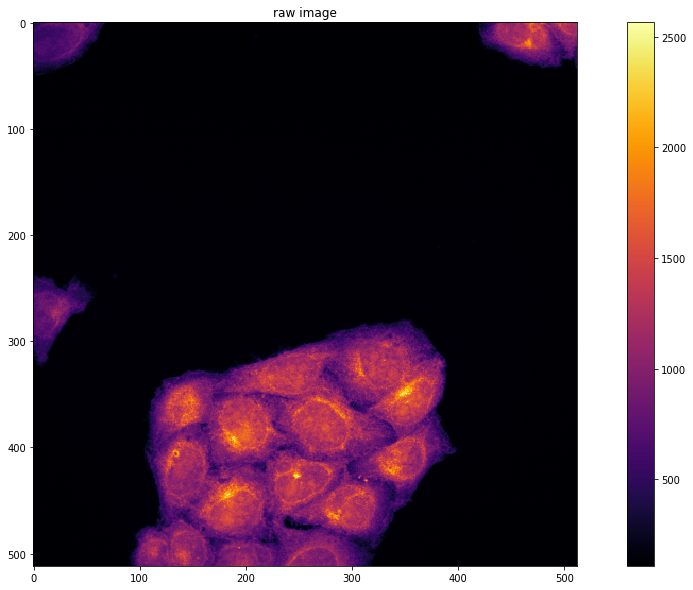

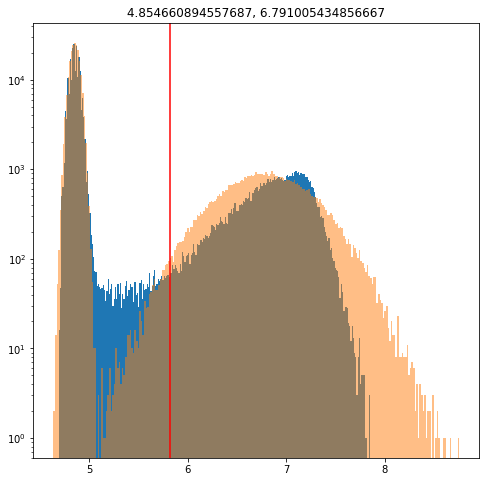

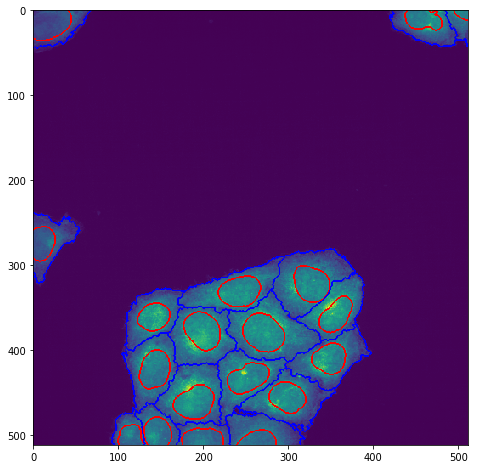

In [5]:
from FishAnalyser import *
%matplotlib inline

def seg(i):
    im_path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/r02c09f0%i-ch2sk1fk1fl1.tif' % i
    nuc = DAPIimage()
    nuc.load(im_path.replace('ch2', 'ch3'), shape=(512, 512, 35), dtype='uint8')
    nuc.segment(NucleiSegmenter3())
    im = CYTimage(nuc.nucleis)

    im.load(im_path, shape=(512, 512, 35))
    im.show_image()
    im.segment(CytoSegmenter2())
    thresh = gmm_threshold(numpy.log1p(numpy.amax(im.image_raw, 2)), plot=True, n_components=2)
    im.show_cells()


# seg(2)
# seg(3)
# seg(4)
seg(5)
# seg(6)
# seg(7)
# seg(8)


In [1]:
% matplotlib inline
from FishAnalyser import *

im_path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/r02c09f05-ch3sk1fk1fl1.tif'

nuc = DAPIimage()
nuc.load(im_path.replace('ch2', 'ch3'))
nuc.segment(FastNuclei())

im = CYTimage(nuc.nucleis)
im.load(im_path)


Segmenting...19 nucleis found.


100%|██████████| 35/35 [00:06<00:00,  5.24it/s]


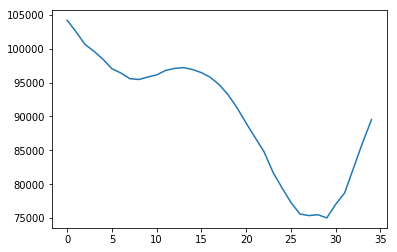

In [2]:
raw = im.image_raw.copy()
from skimage.segmentation import slic
from skimage.morphology import *

binaries = []

for i in tqdm.tqdm(range(35)):
    slice = raw[:, :, i]
    segmented = numpy.log1p(slice) > threshold_otsu(numpy.log1p(slice))
    segmented = binary_opening(segmented, disk(5))
    binaries.append(segmented)

plt.plot([b.sum() for b in binaries])

In [3]:
pile = numpy.zeros_like(raw[:, :, 0])
sizes = [b.sum() for b in binaries]
start = numpy.argmin(sizes)
stop = numpy.argmax(sizes)

stack = []
for i in tqdm.tqdm(range(start, stop-1, -1)):
    p = raw[:, :, i]
    pile += p
    seed = pile.copy()
    # f, ax = plt.subplots(figsize=(10, 10))
    # ax.imshow(p)
    mask = binaries[i]
    # mask = remove_small_holes(mask, 30)
    seed[(nuc.nucleis > 0)*mask] = seed.max()
    # cover = numpy.multiply(mask, nuc.nucleis)
    peaks = peak_local_max(pile*mask, labels=nuc.nucleis*mask, num_peaks_per_label=1, indices=False)
    # This ensures that cells always get the same label throughout the different slices
    markers = peaks*nuc.nucleis
    segmented = watershed(-seed, markers=markers, mask=mask)
    stack.append(segmented)
    # b = find_boundaries(segmented)
    # ax.imshow(segmented)
    # ax.imshow(numpy.ma.masked_where(b==0, b), cmap=colors.ListedColormap(['red']))
    # f.savefig('/Users/remydubois/Desktop/segmented/3d_CM/slice_%i' % i)
# 
stack = numpy.stack(stack, axis=-1)

100%|██████████| 30/30 [00:20<00:00,  1.45it/s]


In [205]:
from mpl_toolkits.mplot3d import Axes3D
import ipyvolume.pylab as p3

fig = plt.figure(figsize=(10, 10))
ax = fig.gca(projection='3d')

# # Make data.
X, Y = numpy.meshgrid(numpy.arange(1080), numpy.arange(1080))
Z = stack
labels = numpy.amax(Z, 2)
labels = labels / labels.max()
# 
# # plt.imshow(colors)
# # Plot the surface.
# colours = numpy.ones((1080, 1080, 4), dtype=int)
# for t in tqdm.tqdm(zip(*numpy.nonzero(labels > 0))):
    # colours[t] = plt.get_cmap('viridis')(labels[t])
# for t in tqdm.tqdm(zip(*numpy.nonzero(labels == 0))):
#     colours[t] = plt.get_cmap('Greys')(0.5)
# 
surf = ax.plot_surface(X, Y, numpy.sum(Z > 0, 2), rstride=1, cstride=1, antialiased=True)
# ax.scatter(X.ravel(), Y.ravel(), Z.ravel())

# ax.voxels(stack)
ax.set_zlim(0, 80)
# p3.figure()
# p3.plot_surface(X, Y, numpy.sum(Z > 0, 2))
# p3.show()
# a = numpy.arange(-5, 5)
# U, V = numpy.meshgrid(a, a)
# X = U
# Y = V
# Z = X*Y**2
# p3.figure()
# p3.plot_surface(X, Z, Y, color="orange")
# p3.plot_wireframe(X, Z, Y, color="black")
# p3.show()

Segmenting...19 cells found.


/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


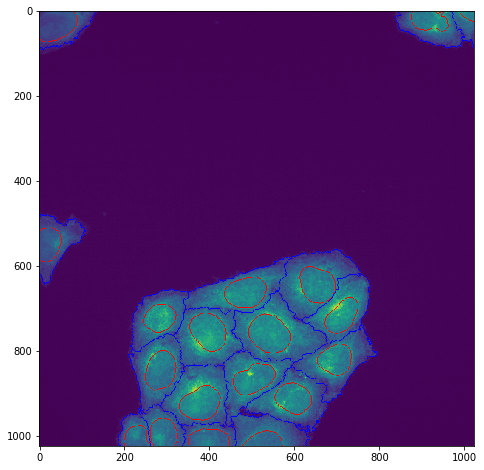

In [4]:
im.segment(CytoSegmenter2())
im.show_cells()

/Users/remydubois/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


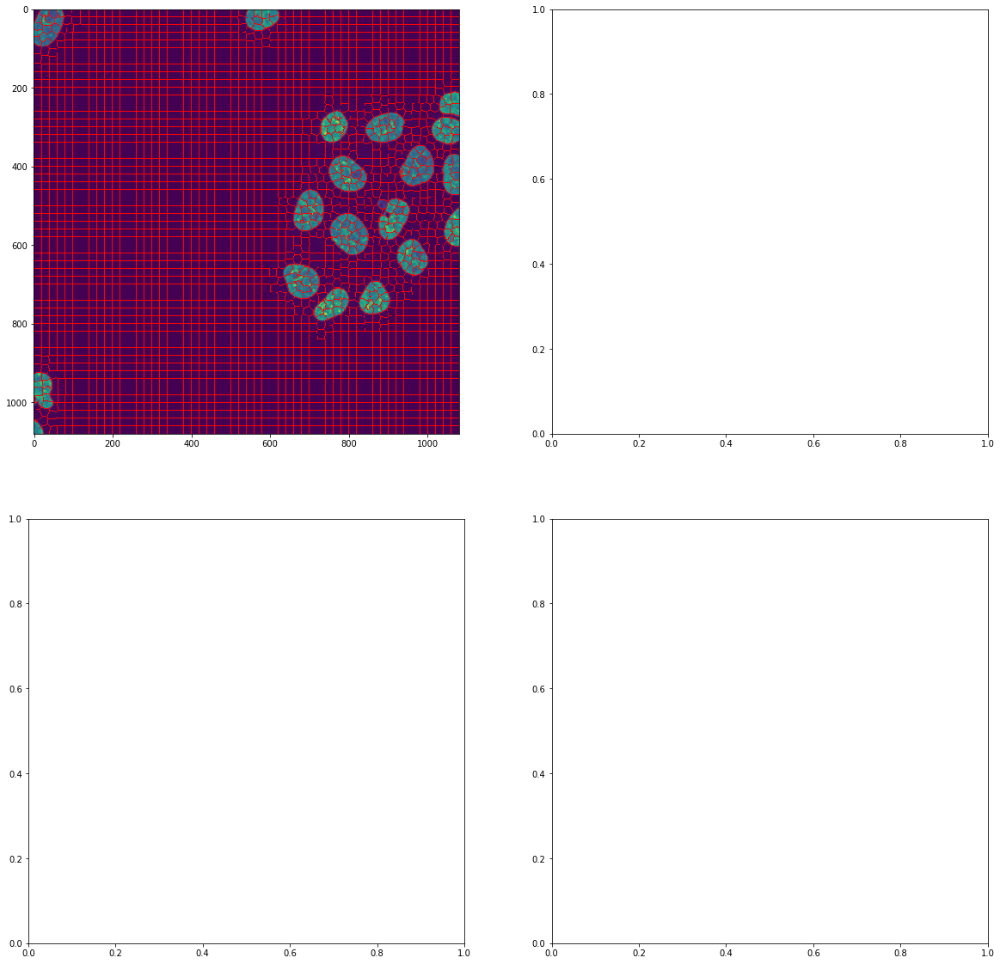

In [77]:
from skimage.segmentation import slic

raw = nuc.image_raw.copy()
mip = numpy.amax(raw, 2)
f, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
ax = ax.ravel()
seg = slic(mip, n_segments=3000, multichannel=False, convert2lab=False, compactness=0.04)
ax[0].imshow(mip)
bounds = find_boundaries(seg)
# ax[1].imshow(bounds)
ax[0].imshow(numpy.ma.masked_where(bounds==0, bounds), cmap=colors.ListedColormap(['red']))
f.show()

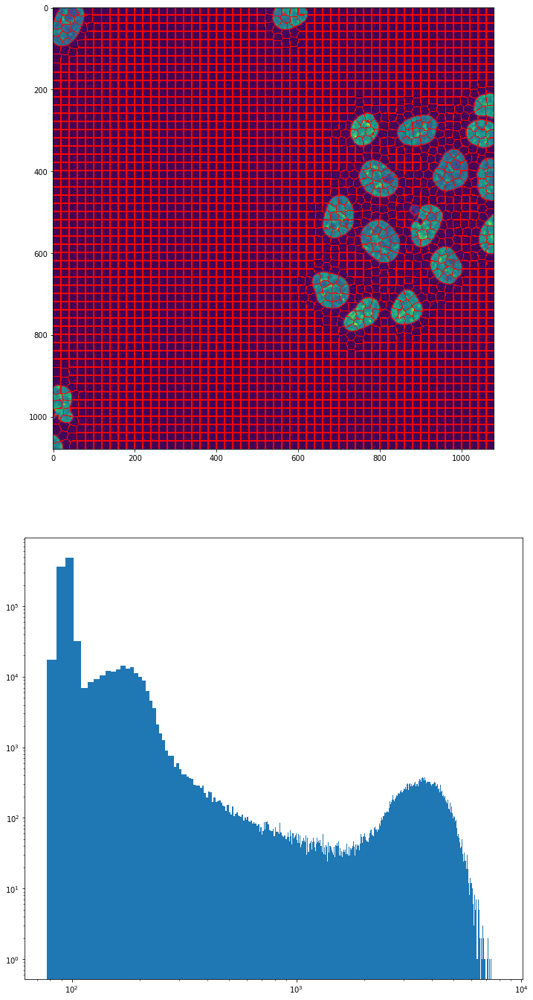

In [57]:
from skimage.segmentation import *

raw = nuc.image_raw.copy()
mip = numpy.amax(raw, 2)
seg = slic(mip, n_segments=3000, multichannel=False, convert2lab=False, compactness=0.05)

bounds = find_boundaries(seg)

f, ax = plt.subplots(nrows=2, figsize=(12, 24))
ax = ax.ravel()
ax[0].imshow(mip)
ax[0].imshow(numpy.ma.masked_where(bounds==0, bounds), cmap=colors.ListedColormap(['red']))
_ = ax[1].hist(0.7*mip.ravel(), bins=1000)
ax[1].set_yscale('log')
ax[1].set_xscale('log')


In [1]:
%matplotlib inline
from scipy.spatial import cKDTree
from scipy.cluster.hierarchy import fclusterdata
from skimage.segmentation import slic
from skimage.morphology import erosion
from skimage.future.graph import *
from FishAnalyser import *

im_path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/r02c09f06-ch3sk1fk1fl1.tif'

nuc = DAPIimage()
nuc.load(im_path.replace('ch2', 'ch3'))
# nuc.segment(FastNuclei())

raw = nuc.image_raw.copy()
mip = numpy.amax(raw, 2)
seg = slic(mip, n_segments=3000, multichannel=False, convert2lab=False, compactness=0.05)



def chisquaredist(centroid1, centroid2, labels):
    label1 = seg[tuple(centroid1)]
    label2 = seg[tuple(centroid2)]
    candidate1 = mip[labels == label1]
    candidate2 = mip[labels == label2]
    bins = numpy.linspace(min([candidate1.min(), candidate2.min()]), max([candidate1.max(), candidate2.max()]), 100)
    hist1, _ = numpy.histogram(candidate1, bins=bins)
    hist2, _ = numpy.histogram(candidate2, bins=bins)

    return sum((a - b) ** 2 / (a + b + 1) for a, b in zip(hist1, hist2))
# 
# 
# centroids = [[int(r.centroid[0]), int(r.centroid[1])] for r in regionprops(seg)]
# # tree = cKDTree(centroids, 2)
# 
# # Find all neighbor label for each label in the image:
# 
# # adj_mat = numpy.zeros((numpy.unique(seg).shape[0], numpy.unique(seg).shape[0]))
# rag = rag_mean_color(mip, seg, mode='distance')
# seg2 = cut_threshold(seg, rag, 4000)
# 
# f, ax = plt.subplots(figsize=(8, 8))
# ax = ax.ravel()
# ax.imshow(mip[700:800, 290:300])
# bounds = find_boundaries(seg[700:800, 290:300])
# ax.imshow(numpy.ma.masked_where(bounds == 0, bounds), cmap=colors.ListedColormap(['red']))
# for r in regionprops(seg[700:800, 290:300]):
#     ax.text(int(r.centroid[1]), int(r.centroid[0]), r.label)


/Users/remydubois/Documents/rd_repos/CBIO/spot_detection


100%|██████████| 7308/7308 [00:00<00:00, 99971.21it/s]


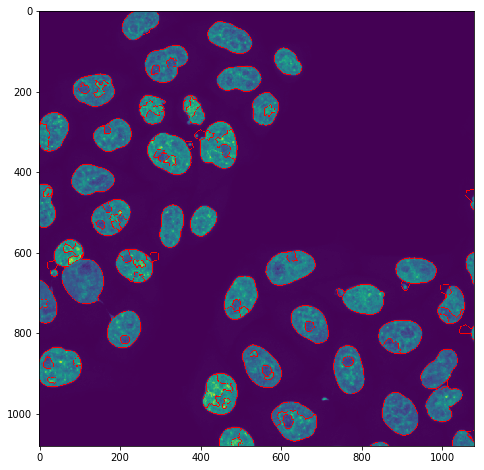

In [15]:
import networkx as nx
import scipy.ndimage as ndi
from skimage.morphology import skeletonize
from numpy.lib.stride_tricks import as_strided
from scipy.ndimage.measurements import mean
import sys

sys.path.append('/Users/remydubois/Documents/rd_repos/CBIO/spot_detection')
import os

print(os.getcwd())
from FishAnalyser import *
from Image.segmentation import *
from skimage.segmentation import slic
from skimage.future.graph import rag_mean_color, RAG

im_path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/r02c09f09-ch3sk1fk1fl1.tif'

nuc = DAPIimage()
nuc.load(im_path.replace('ch2', 'ch3'))
# nuc.segment(FastNuclei())

raw = nuc.image_raw.copy()
mip = numpy.amax(raw, 2)
seg = slic(mip, n_segments=3000, multichannel=False, convert2lab=False, compactness=0.05)
g = nx.Graph()


def populate2(m, g, raw):
    mean_per_label = mean(raw, m, numpy.unique(m))
    # st = time.time()
    h = numpy.stack((m[1:, :].ravel(), m[:-1, :].ravel()), axis=1)
    v = numpy.stack((m[:, 1:].ravel(), m[:, :-1].ravel()), axis=1)
    # print(time.time() - st)
    # st = time.time()
    # v = v[v[:, 0] != v[:, 1]]
    # nv = numpy.unique(v, axis=0)
    # h = h[h[:, 0] != h[:, 1]]
    # nh = numpy.unique(h, axis=0)
    # print(time.time() - st)
    # st = time.time()
    edges = numpy.vstack((v, h))
    # print(time.time()  - st)
    # st = time.time()
    edges.sort(axis=1)
    edges = edges[edges[:, 0] != edges[:, 1]]
    edges = numpy.unique(edges, axis=0)
    # print(time.time() - st)
    for e in tqdm.tqdm(edges):
        g.add_node(e[0], labels=e[0], mean=mean_per_label[e[0]])
        g.add_node(e[1], labels=e[1], mean=mean_per_label[e[1]])
        dist = numpy.abs(mean_per_label[e[0]] - mean_per_label[e[1]])
        # print(dist)
        g.add_edge(*e, distance=dist)


populate2(seg, g, mip)
to_remove = [(x, y) for x, y, d in g.edges(data=True)
             if d['distance'] >= 1000]
g.remove_edges_from(to_remove)

new_labels = seg.copy()
comps = nx.connected_components(g)
for i, nodes in enumerate(comps):
    for n in nodes:
        new_labels[new_labels == n] = i

f, ax = plt.subplots(figsize=(8, 8))
ax.imshow(mip)
bounds = find_boundaries(new_labels)
ax.imshow(numpy.ma.masked_where(bounds == 0, bounds), cmap=colors.ListedColormap(['red']))


In [10]:
import heapq

mean_per_label = mean(mip, seg, numpy.unique(seg))
test = nx.Graph()
populate2(seg, test, mip)

# edges = list(g.edges(data=True))
edge_heap = []
for n1, n2, d in test.edges(data=True):
    # print(n1, n2)
    item = [True, n1, n2, d['distance']]
    heapq.heappush(edge_heap, item)
    d['heap_item'] = item

i = 0
name = seg.max()
while len(edge_heap) > 0: #  and edge_heap[0][-1] < 1000:
    valid, n1, n2, dist = heapq.heappop(edge_heap)
    # print(n1, n2, valid)
    if valid:
        # print('|', end='', flush=True)
        # Invalidate edges toward those nodes:
        for nbr in test.neighbors(n1):
            # print(test[n1][nbr])
            test[n1][nbr]['heap_item'][0] = False
        for nbr in test.neighbors(n2):
            test[n2][nbr]['heap_item'][0] = False

        test = nx.contracted_nodes(test, n1, n2, False)
        nx.relabel_nodes(test, {n1: name}, False)
        nx.set_node_attributes(test, {name: numpy.mean(mip[numpy.isin(seg, [n1, n2])])}, 'mean')
        # nx.set_node_attributes(test, {name: [n1, n2]}, 'labels')

        for e in test.edges(name):
            # print('.', end='', flush=True)
            m0 = nx.get_node_attributes(test, 'mean')[e[0]]
            m1 = nx.get_node_attributes(test, 'mean')[e[1]]
            nx.set_edge_attributes(test, {e: numpy.abs(m0 - m1)}, 'distance')
            heapq.heappush(edge_heap, [True, e[0], e[1], numpy.abs(m0 - m1)])
        name += 1
    print(len(list(test.nodes)), end='\r')
    if i == 1000:
        break

# for 

100%|██████████| 7308/7308 [00:00<00:00, 29651.62it/s]


NetworkXError: The node 2 is not in the graph.

In [14]:
import heapq

mean_per_label = mean(mip, seg, numpy.unique(seg))
test = nx.Graph()
populate2(seg, test, mip)

# edges = list(g.edges(data=True))
# edge_heap = []
# for n1, n2, d in test.edges(data=True):
#     print(n1, n2)
    # item = [True, n1, n2, d['distance']]
    # heapq.heappush(edge_heap, item)
    # d['heap_item'] = item

i = 0
name = seg.max()
while len(list(test.nodes())) > 1000: #  and edge_heap[0][-1] < 1000:
    gen = iter(list(test.edges))
    
    node = next(gen)
    for nbr in sorted(test.neighbors(node), key=lambda x: nx.get_node_attributes(G,'mean')[x]):
        print(nbr)
        if numpy.abs([]) < threshold:
            test = nx.contracted_nodes(test, node, nbr, False)
            nx.set_node_attributes(test, {name: numpy.mean(mip[numpy.isin(seg, [n1, n2])])}, 'mean')
            break
    
    break
    # print(n1, n2, valid)
    if valid:
        # print('|', end='', flush=True)
        # Invalidate edges toward those nodes:
        for nbr in test.neighbors(n1):
            # print(test[n1][nbr])
            test[n1][nbr]['heap_item'][0] = False
        for nbr in test.neighbors(n2):
            test[n2][nbr]['heap_item'][0] = False

        test = nx.contracted_nodes(test, n1, n2, False)
        nx.relabel_nodes(test, {n1: name}, False)
        nx.set_node_attributes(test, {name: numpy.mean(mip[numpy.isin(seg, [n1, n2])])}, 'mean')
        # nx.set_node_attributes(test, {name: [n1, n2]}, 'labels')

        for e in test.edges(name):
            # print('.', end='', flush=True)
            m0 = nx.get_node_attributes(test, 'mean')[e[0]]
            m1 = nx.get_node_attributes(test, 'mean')[e[1]]
            nx.set_edge_attributes(test, {e: numpy.abs(m0 - m1)}, 'distance')
            heapq.heappush(edge_heap, [True, e[0], e[1], numpy.abs(m0 - m1)])
        name += 1
    print(len(list(test.nodes)), end='\r')
    if i == 1000:
        break

# for 


100%|██████████| 7308/7308 [00:00<00:00, 52193.29it/s]

1


TypeError: 'numpy.float64' object is not callable

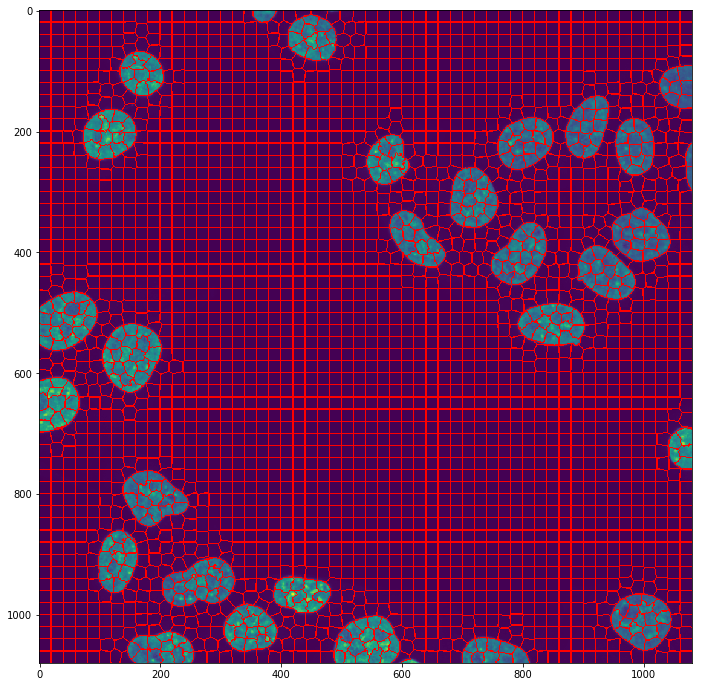

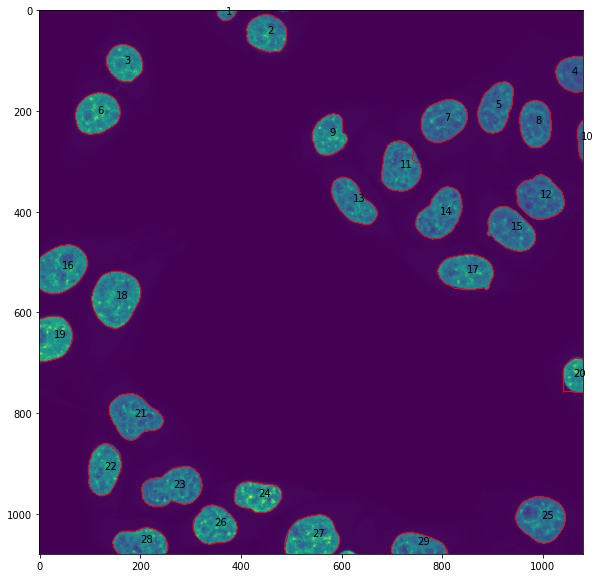

In [113]:
from FishAnalyser import *

###########################################################
###########################################################
#       Background identification
###########################################################
###########################################################

dirlist = [
    '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/',
    '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/E09_MELK/',
    '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/E11_NDE1/'
]

files = [idir + f for idir in dirlist for f in listdir(idir)]
masks = list(filter(lambda s: s.lower().endswith('.tif') and re.search('ch2', s), files))

backgrounds = []
for p in tqdm.tqdm(masks):
    im = FQimage()
    im.load(p, shape=None)
    
    backgrounds.append(im.image_raw[:, :, -1])
    del im

100%|██████████| 26/26 [00:35<00:00,  1.38s/it]


In [198]:
im = FQimage()
im.load(masks[0])


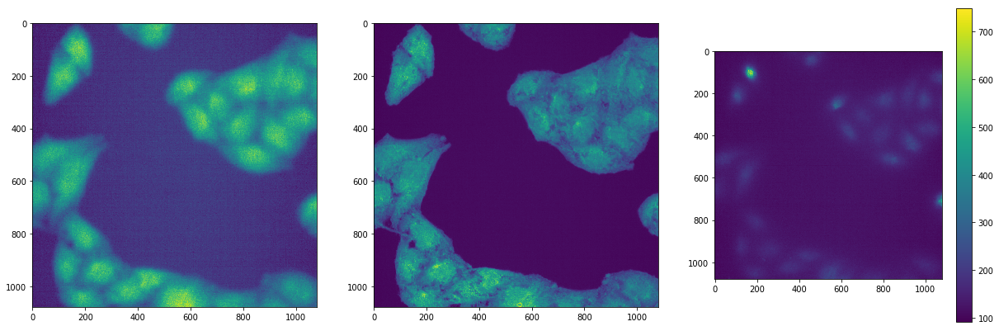

In [112]:
raw = im.image_raw.copy()

f, ax =plt.subplots(ncols=3, figsize=(21, 7))
ax = ax.ravel()
ax[0].imshow(raw[:, :, 0])
ax[1].imshow(raw[:, :, 8])
a = ax[2].imshow(raw[:, :, 34])
f.colorbar(a, ax=ax[2])

/Users/remydubois/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: DeprecationWarning: `spline` is deprecated!
spline is deprecated in scipy 0.19.0, use Bspline class instead.


[126.99971633]
[[42.14930824]]


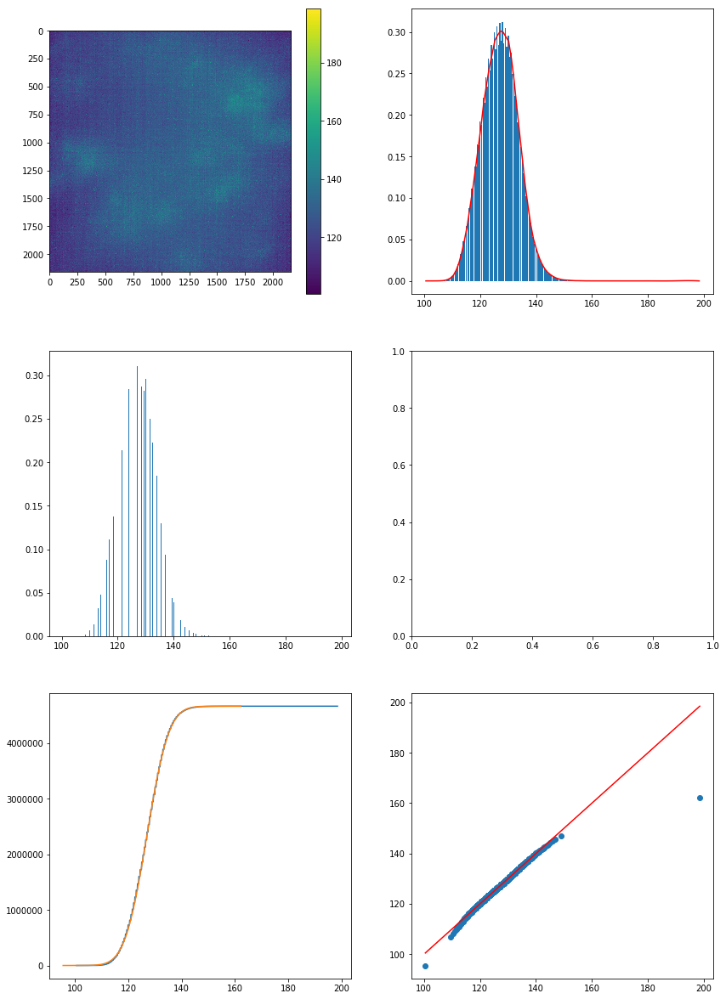

In [172]:
from scipy.stats import boxcox, probplot
from sklearn.preprocessing import StandardScaler, QuantileTransformer
from scipy.interpolate import spline

sc = StandardScaler()
qt = QuantileTransformer(output_distribution='normal')

background = numpy.median(backgrounds, axis=0)
f, ax = plt.subplots(ncols=2, nrows=3, figsize=(14, 21))
ax = ax.ravel()
cax = ax[0].imshow(background)

h, x = numpy.histogram(background.ravel(), bins=1000, density=True)
x = (x[1:] + x[:-1]) / 2
ax[1].bar(x, h, width=0.4)
new_x, new_h = tuple(zip(*filter(lambda t: t[1] > 0, zip(x, h))))
t = numpy.linspace(min(new_x), max(new_x), 100)
ax[1].plot(t, spline(new_x, new_h, t), color='r')


# bc, _ = boxcox(background.reshape(-1, 1))
# bc = numpy.log(background.reshape(-1, 1))
# bc = qt.fit_transform(background.reshape(-1, 1))
bc = background.reshape(-1, 1)
# X = sc.fit_transform(bc)

ax[2].hist(bc.ravel(), bins=1000, density=True)
# ax[3].hist(X.ravel(), bins=1000, density=True)


GM = GaussianMixture(n_components=1)
GM.fit(bc)
print(GM.means_[0])
print(GM.covariances_[0])
samples, _ = GM.sample(bc.shape[0])
samples = samples[samples < background.max()]
h, x = numpy.histogram(bc.ravel(), bins=1000)
ax[4].plot((x[1:] + x[:-1]) / 2, numpy.cumsum(h))
h, x = numpy.histogram(samples, bins=1000)
ax[4].plot((x[1:] + x[:-1]) / 2, numpy.cumsum(h))
# ax[2].axvline(GM.means_[0, 0], c='r')
# ax[2].axvline(GM.means_[0, 0] + 2 * GM.covariances_[0, 0], c='b')
# ax[2].axvline(GM.means_[0, 0] - 2 * GM.covariances_[0, 0], c='b')
h_fit = numpy.percentile(samples, numpy.linspace(0, 100, 1000))
h_exp = numpy.percentile(bc.ravel(), numpy.linspace(0, 100, 1000))
# print(h_fit)
# print(h_exp)
ax[5].scatter(h_exp, h_fit)
# ax[5].set_xlim([h_exp.min(), h_exp.max()])
# ax[5].set_ylim([h_fit.min(), h_fit.max()])
ax[5].plot(h_exp, h_exp, c='r')
f.colorbar(cax, ax=ax[0])


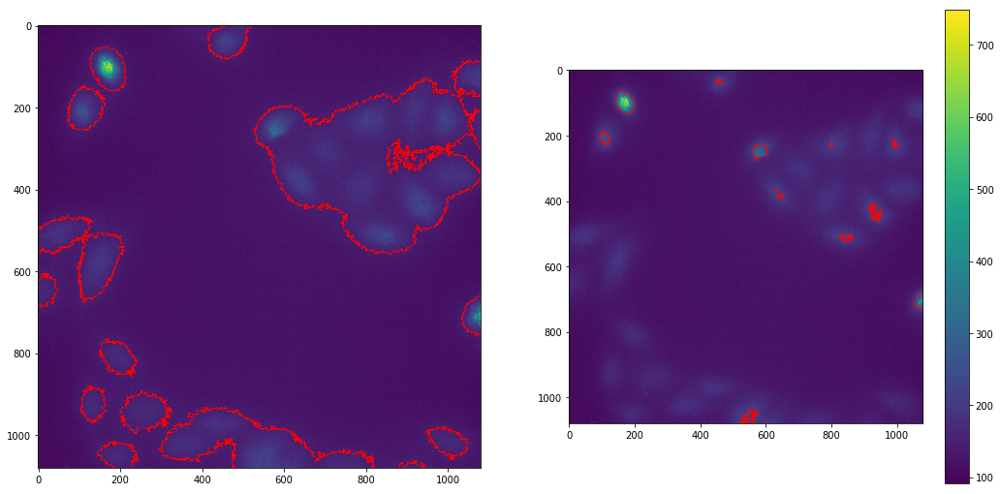

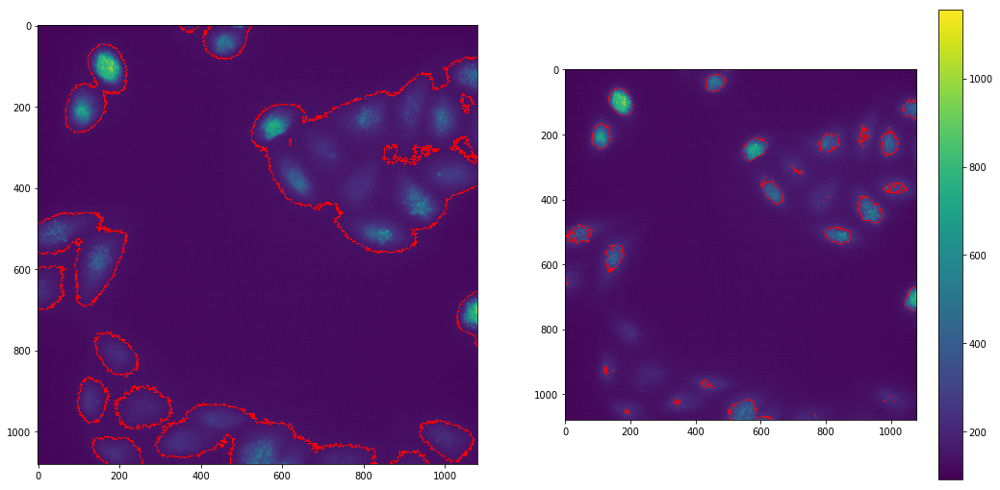

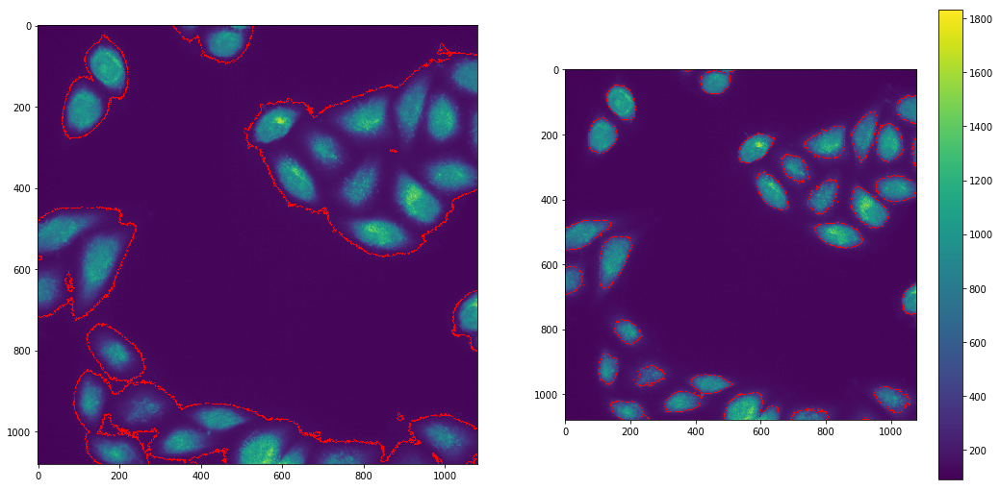

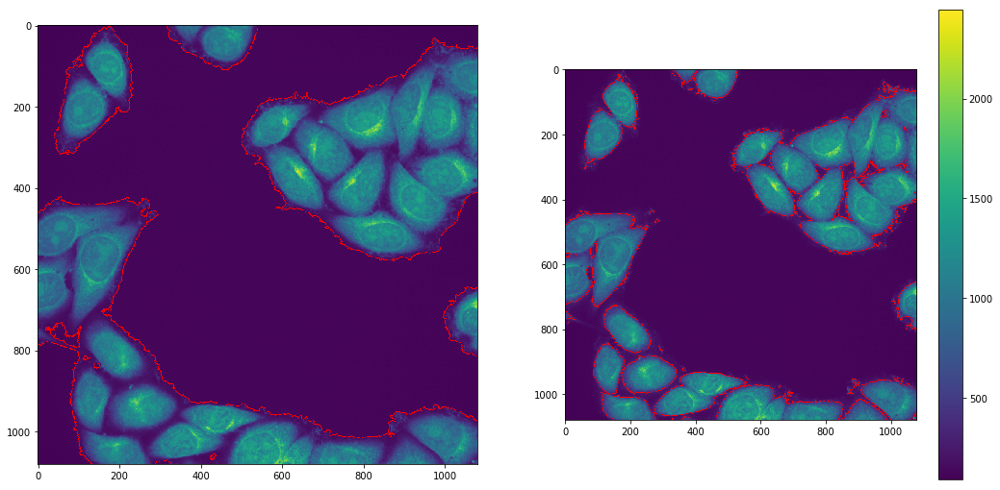

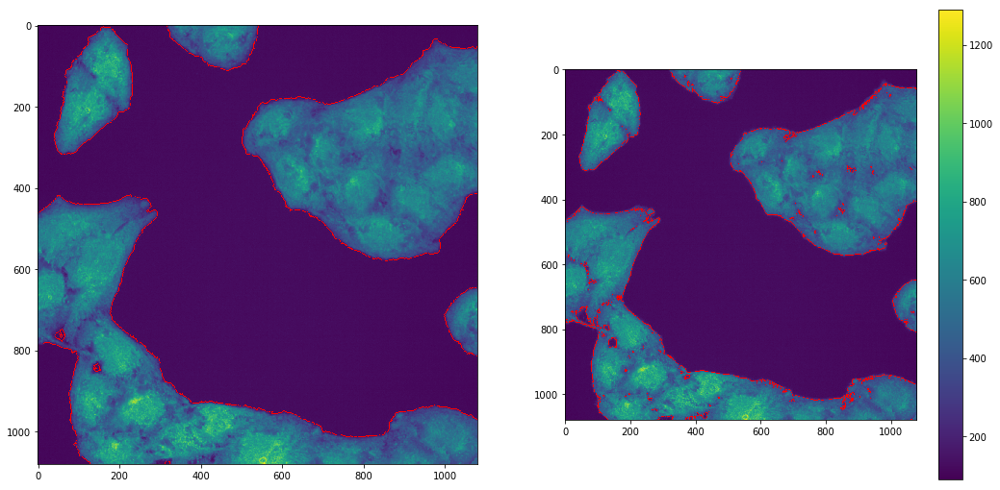

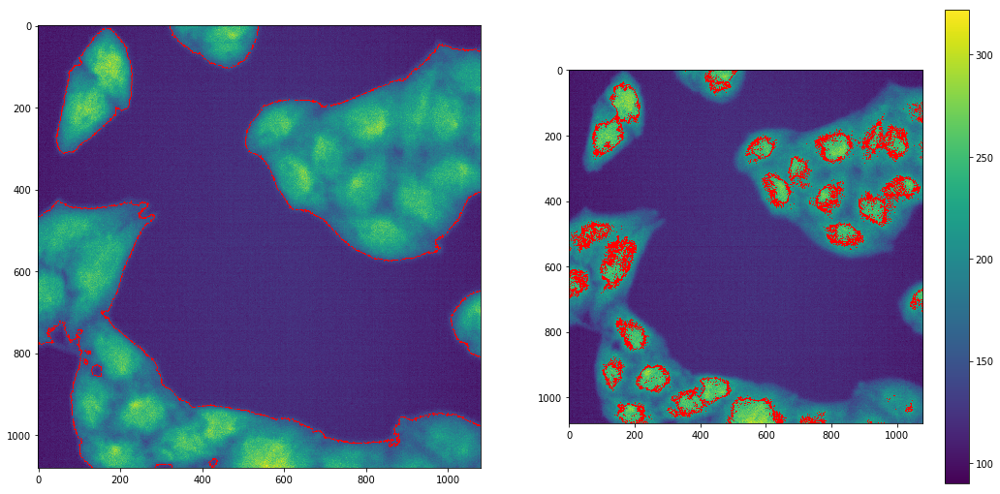

In [199]:
mean_noise = GM.means_[0, 0]
stdv_noise = math.sqrt(GM.covariances_[0, 0])
# print(GM.predict([[120]]))
thresholds = [threshold_otsu(numpy.log(im.image_raw[:, :, i])) for i in range(35)] 
for i in [34, 30, 24, 16, 8, 3]:
    raw = im.image_raw[:, :, i].copy()
    
    # transformed = qt.transform(raw.reshape(-1, 1)).reshape(raw.shape)
    bin = remove_small_holes(raw > mean_noise + 3 * stdv_noise, 50)
    bin = label(bin)
    bin = remove_small_objects(bin, 100)
    bounds = find_boundaries(bin)
    f, ax = plt.subplots(ncols=2, figsize=(18, 9))
    ax = ax.ravel()
    a = ax[0].imshow(raw)
    f.colorbar(a, ax=ax[1])
    ax[0].imshow(numpy.ma.masked_where(bounds==0, bounds), cmap=colors.ListedColormap(['red']))
    ax[1].imshow(raw)
    bounds = find_boundaries(numpy.log(raw) > (thresholds[i] + max(thresholds)) / 2)
    ax[1].imshow(numpy.ma.masked_where(bounds==0, bounds), cmap=colors.ListedColormap(['red']))

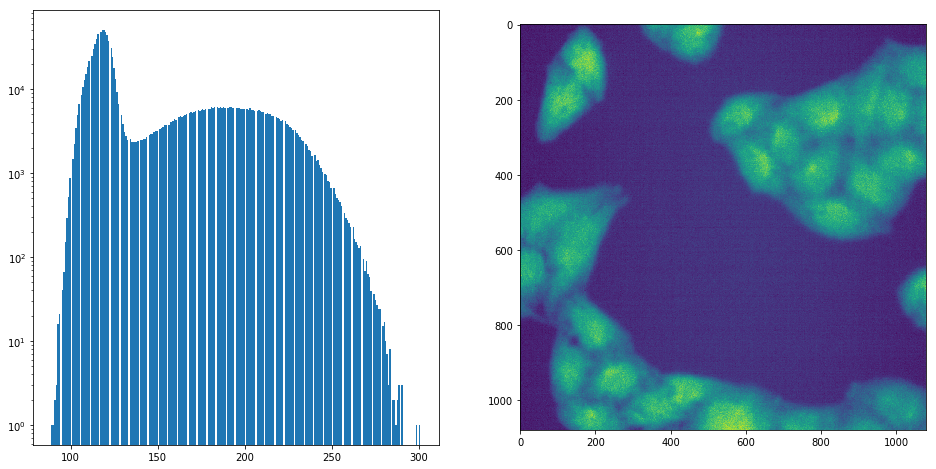

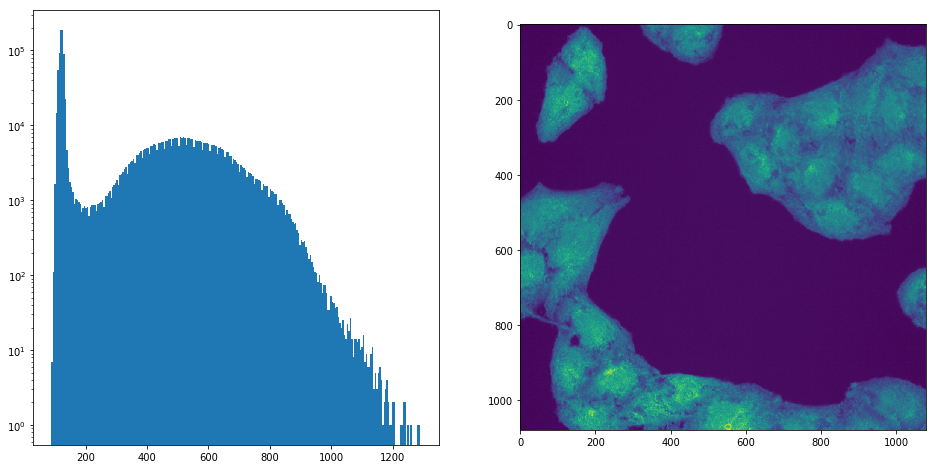

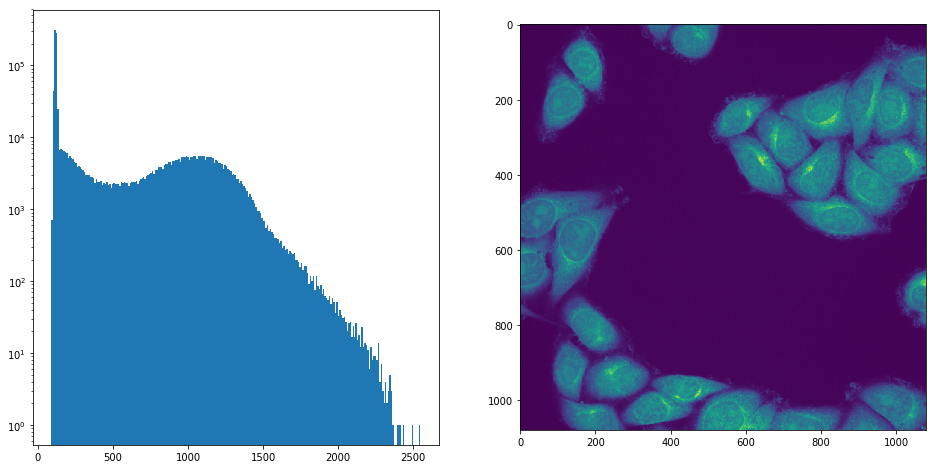

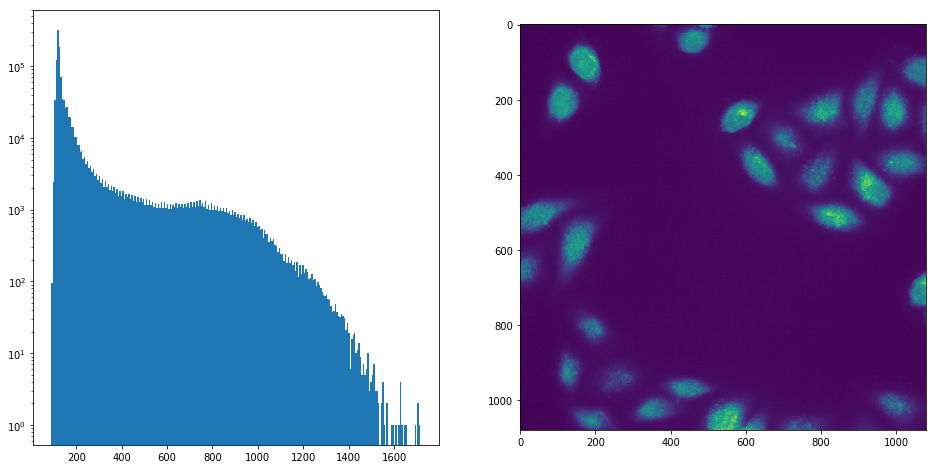

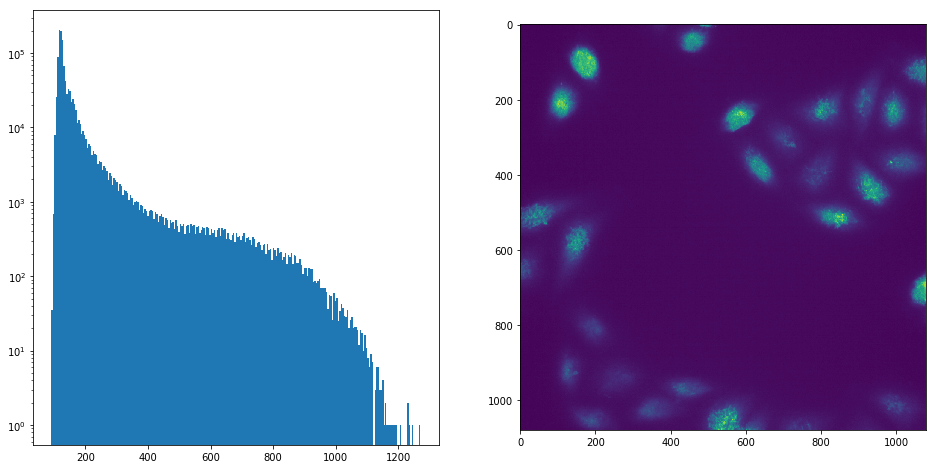

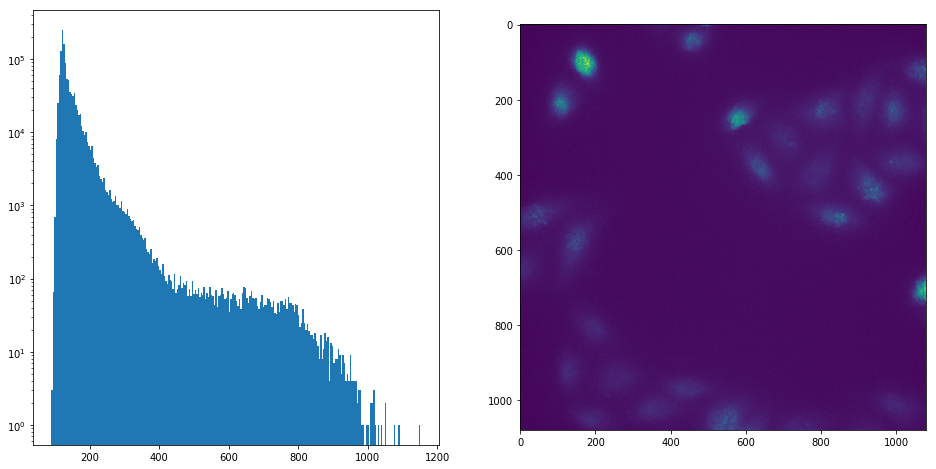

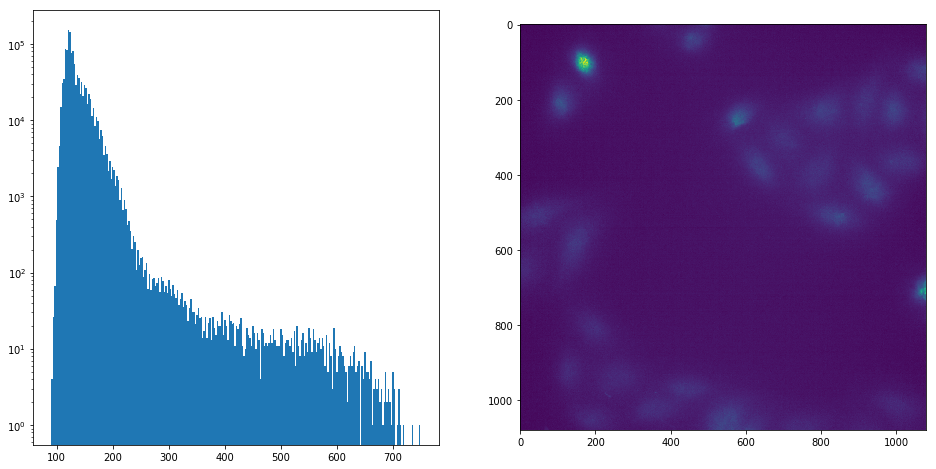

In [169]:
for i in [2, 8, 15, 25, 28, 31, 34]:
    f, ax =plt.subplots(figsize=(16, 8), ncols=2)
    ax = ax.ravel()
    _ = ax[0].hist(im.image_raw[:, :, i].ravel(), bins=250)
    ax[0].set_yscale('log')
    ax[1].imshow(im.image_raw[:, :, i])

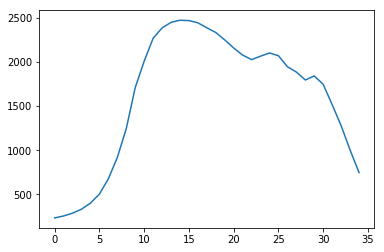

In [196]:
from sklearn.manifold import TSNE
from scipy.stats import kurtosis
X = [numpy.percentile(im.image_raw[200, 100, i], numpy.linspace(1, 100, 100)) for i in range(35)]
X = numpy.stack(X)

plt.plot([threshold_otsu(im.image_raw[:, :, i]) for i in range(35)])

# X = sc.fit_transform(X)
# km = KMeans(n_clusters=2)
# 
# tsne = TSNE()
# y = tsne.fit_transform(X)
# 
# plt.scatter(y[:, 0], y[:, 1])
# 
# y = km.fit_predict(X)
# print(y)

In [1]:
from sklearn.cluster import MiniBatchKMeans, KMeans
from skimage.segmentation import slic
from FishAnalyser import *

im_path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/r02c09f03-ch2sk1fk1fl1.tif'
nuc = DAPIimage()
nuc.load(im_path.replace('ch2', 'ch3'), shape=(1024, 1024, 35), dtype='uint8')
nuc.segment(FastNuclei())

raw = nuc.image_raw.copy()
mip = numpy.amax(raw, 2)

seg = slic(mip, n_segments=9000, multichannel=False, convert2lab=False, compactness=0.05)


# stack = numpy.stack((seg.ravel(), mip.ravel()))

# histo = numpy.histogram2d(seg.ravel(), mip.ravel(), bins=(9000, 1000))
# print(histo[0][0])

rag = HistoColorRag(seg, mip)
# rag = Mea
# X, Y = numpy.indices(mip.shape)
# data = numpy.hstack((X.reshape(-1, 1), Y.reshape(-1, 1), mip.reshape(-1, 1)))

# cl = MiniBatchKMeans(n_clusters=3000, batch_size=10000, verbose=True)
# cl = KMeans(n_clusters=3000, verbose=True)
# cl.fit(data)
# f, ax = plt.subplots(figsize=(12, 12))
# ax.imshow(mip)
# boundaries = find_boundaries(seg)
# ax.imshow(numpy.ma.masked_where(boundaries==0, boundaries), cmap=colors.ListedColormap(['red']))


Segmenting...28 nucleis found.


100%|██████████| 20792/20792 [00:20<00:00, 1032.63it/s]


In [4]:
def cut_threshold(rag, labels, raw, threshold):
    g = rag.copy()
    to_remove = [(x, y) for x, y, d in g.edges(data=True) if d['distance'] >= threshold]
    # print(len(to_remove))
    g.remove_edges_from(to_remove)

    components = list(nx.connected_components(g))
    out = numpy.zeros_like(labels)

    # Allows to avoid filling all the background.
    zero = numpy.argmax([len(c) for c in components])

    for i, nodes in tqdm.tqdm(enumerate(components), total=len(components)):
        if i == zero:
            continue
        for n in nodes:
            out[labels == n] = i

    return out

100%|██████████| 62/62 [00:02<00:00, 26.40it/s]


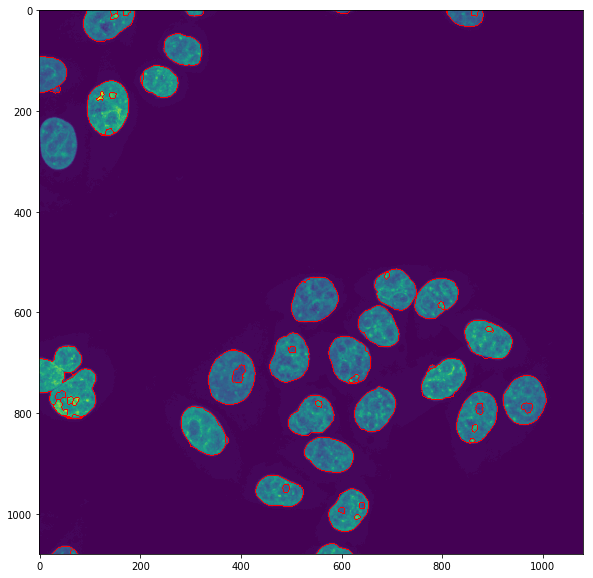

In [3]:
# print(rag.edges(10, data=True))
out = cut_threshold(rag, seg, mip, 110)


# plt.imshow(out)
bounds = find_boundaries(out)
f, ax = plt.subplots(figsize=(10, 10))
ax.imshow(mip)
ax.imshow(numpy.ma.masked_where(bounds==0, bounds), cmap=colors.ListedColormap(['red']))


In [102]:
%matplotlib inline
def gmm_threshold2(img, n_components=3, plot=False, border=-1, return_aic=False):
    if img.ndim > 2:
        warnings.warn('Working on a 3d image, expect high computational time.')
    flag = False
    GMM = GaussianMixture(n_components=n_components)
    GMM.fit(img.reshape(-1, 1))
    # Find threshold
    xs = numpy.linspace(img.min(), img.max(), 1000)
    ys = GMM.predict(xs.reshape(-1, 1))
    inds = numpy.nonzero(ys[1:] - ys[:-1])[0]
    # print(ys)
    thresh = xs[inds[border]]
    # otsu = threshold_otsu(img)
    # means = numpy.sort(GMM.means_.ravel())
    # thresh = numpy.mean([means[1:], means[:-1]], axis=0)[border]
    # print(numpy.mean([means[1:], means[:-1]], axis=0))
    if plot:
        f, ax = plt.subplots(figsize=(8, 8))
        ax.hist(img.ravel(), bins=255, label='Observed data')
        sample, _ = GMM.sample(numpy.prod(img.shape))
        ax.hist(sample[sample > img.min()], bins=255, alpha=0.5, label='Model')
        ax.axvline(thresh, c='r')
        # ax.axvline(275, c='g', linestyle='dashed')
        # ax.axvline(otsu, c='b')
        ax.text(thresh-75, 10,  'GMM Threshold', rotation=90, color='r')
        # ax.text(275 + 25, 1.e5, '"optimal" Threshold', rotation=90, color='g')
        # ax.text(otsu + 25, 10, 'Otsu Threshold', rotation=90, color='b')
        # ax.set_xticks(list(range(0, 3000, 500)) + [thresh])
        ax.set_yscale('log')
        ax.set_title('Cell mask pixel intensity histogram (blue) and fitted GMM (light orange)')
        ax.set_xlabel('Pixel intensity values')
        ax.set_ylabel('Pixels count (log)')
        ax.legend()
        # ax.set_xlim([0, 3000])
        f.show()
    if return_aic:
        return thresh, GMM.aic(img.reshape(-1, 1))
    return thresh

from FishAnalyser import *
conf_path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/r02c09f02-ch3sk1fk1fl1.tif'
WF_path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_WF/3D/E09_MELK/r05c09f03-ch2sk1fk1fl1.tif'
hilo_path = '/Users/remydubois/Desktop/Remy/_REMY/hilo_tournant/Stacks/B09_DYNC1H1/171208_01_w2TIRF-488.TIF'
nuc = DAPIimage()
nuc.load(WF_path)
raw = nuc.image_raw.copy()

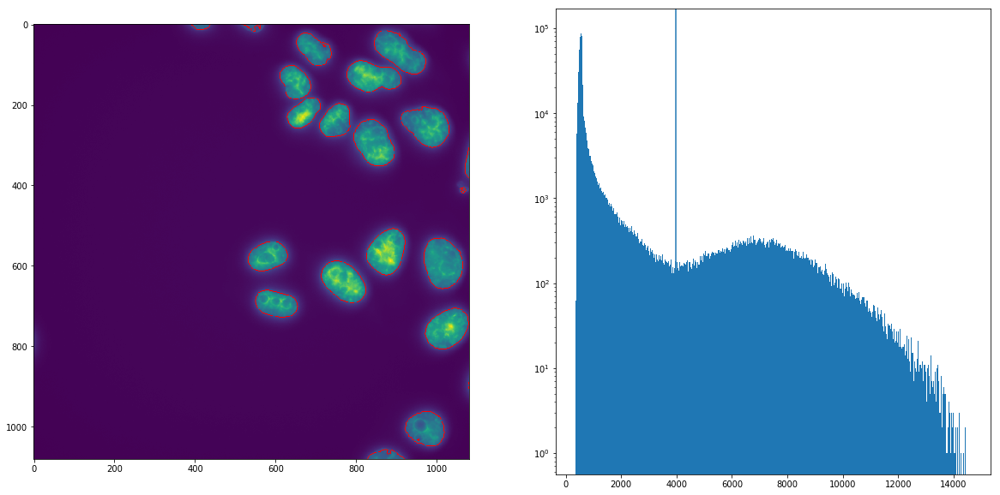

In [90]:
mip = numpy.amax(raw[..., 15:25], 2)
# t = gmm_threshold2(numpy.log1p(mip), n_components=2, plot=False)
t = threshold_otsu(mip)
mask = numpy.log1p(mip) > threshold_otsu(numpy.log1p(mip))
# t = rank.otsu(mip, selem=disk(100), mask=mask)
boundaries = find_boundaries(mip > t)

f, (ax, ax2) = plt.subplots(figsize=(20, 10), ncols=2)
ax.imshow(mip)
ax.imshow(numpy.ma.masked_where(boundaries == 0, boundaries), cmap = colors.ListedColormap(['red']))
_ = ax2.hist(mip.ravel(), bins=1000)
ax2.set_yscale('log')
ax2.axvline(t)

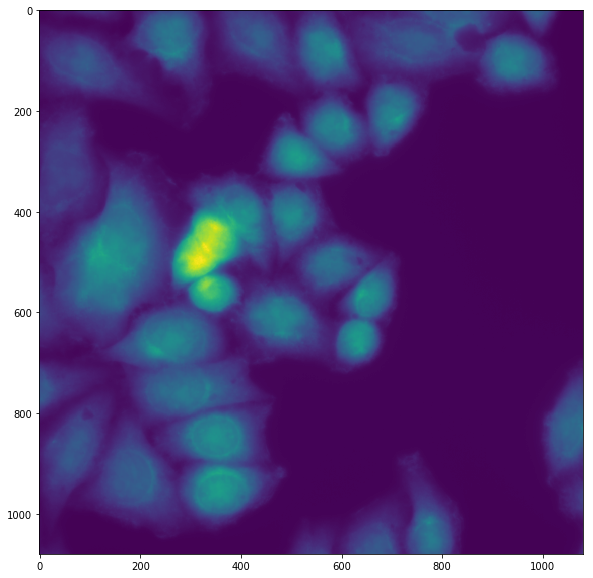

In [111]:
mip = numpy.sum(raw[..., 10:20], 2)

f, ax = plt.subplots(figsize=(10, 10))
ax.imshow(mip)

In [2]:
from FishAnalyser import *
from skimage.segmentation import slic

path = '/Users/remydubois/Desktop/Remy/_REMY/Opera_Conf/3D/B09_DYNC1H1/r02c09f02-ch2sk1fk1fl1.tif'
im = DAPIimage()
im.load(path)
raw = im.image_raw.copy()

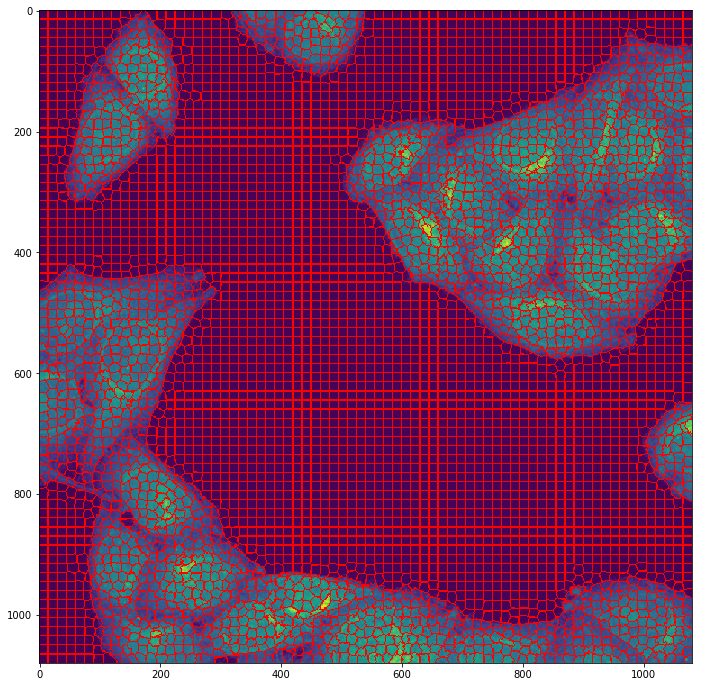

In [20]:
mip = numpy.amax(raw, 2)
seg = slic(mip, n_segments=5000, compactness=.005, multichannel=False)
b = find_boundaries(seg)
f, ax = plt.subplots(figsize=(12, 12))
ax.imshow(mip)
ax.imshow(numpy.ma.masked_where(b==0, b), colors.ListedColormap(['red']))
